# pix2pix for Maps to Aerial Image Translation

In [1]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
import pixutils as pxu
from pix2pix import UNet, PatchGAN, fit
import wandb
import os

In [2]:
wandb.login()

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [3]:
train_path = "pix2pix-maps/train/*.jpg"
val_path = "pix2pix-maps/val/*.jpg"

buffer_size = 256
image_size = 256

config = {
    "batch_size": 1,
    "lr_gen": 0.0002,
    "beta_1_gen": 0.5,
    "lr_disc": 0.0002,
    "beta_1_disc": 0.5,
    "l1_lambda": 100,
}

## Run the following code block on Kaggle only

In [4]:
train_path = f"/kaggle/input/{train_path}"
val_path = f"/kaggle/input/{val_path}"

## Load dataset

In [5]:
train = tf.data.Dataset.list_files(train_path)
val = tf.data.Dataset.list_files(val_path)

In [6]:
train = train.map(pxu.load_image)
train = train.map(lambda input_image, real_image: pxu.extract_patches(input_image, real_image, image_size))
# data are in batches of size 'num_of_patches' after 'extract_patches'
train = train.unbatch()
train = train.map(lambda input_patches, real_patches: pxu.random_jitter(input_patches, real_patches, 286))
train = train.map(pxu.rescale_images)
train = train.shuffle(buffer_size)
train = train.batch(config["batch_size"])

val = val.map(pxu.load_image)
val = val.map(lambda input_image, real_image: pxu.extract_patches(input_image, real_image, image_size))
# data are in batches of size 'num_of_patches' after 'extract_patches'
val = val.unbatch()
val = val.map(pxu.rescale_images)
val = val.batch(config["batch_size"])

## Visualize a few images

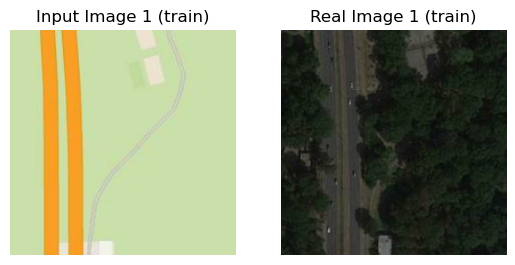

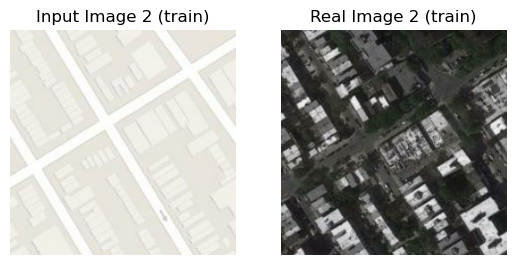

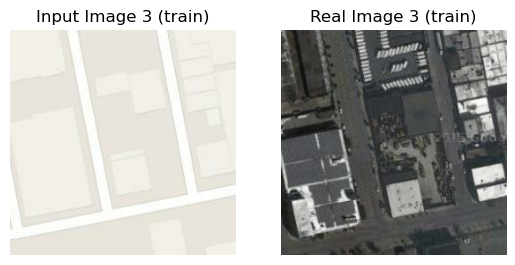

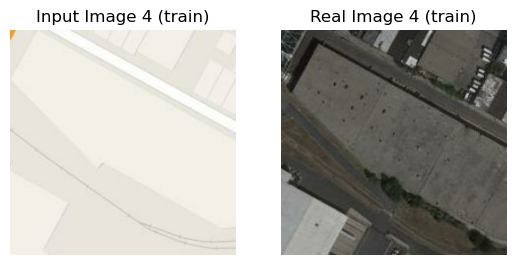

In [7]:
i = 0
for input_batch, real_batch in train.take(4):
    for input_image, real_image in zip(input_batch, real_batch):
        i += 1
        pxu.show(
            input_image,
            real_image,
            i,
            "train"
        )

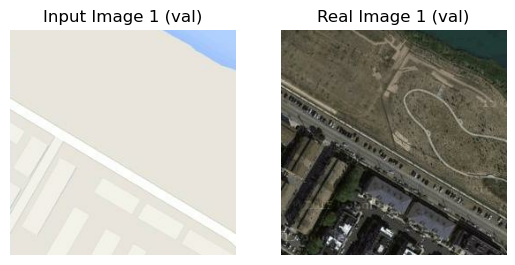

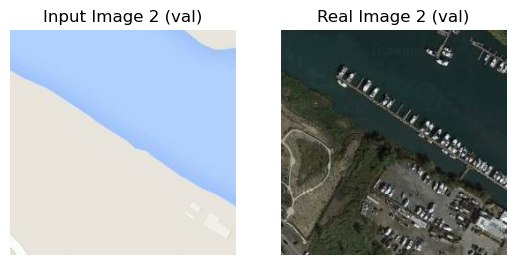

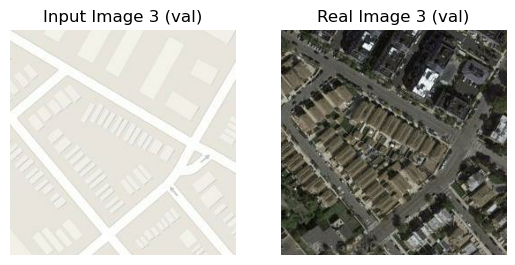

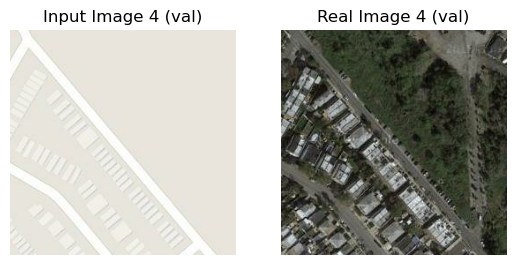

In [8]:
i = 0
for input_batch, real_batch in val.take(4):
    for input_image, real_image in zip(input_batch, real_batch):
        i += 1
        pxu.show(
            input_image,
            real_image,
            i,
            "val"
        )

## Create models

In [9]:
G = UNet(input_shape=(image_size, image_size, 3))
D = PatchGAN(input_shape=(image_size, image_size, 3), patch_size=286)

config["epochs"] = 200

restore_last_epoch = 60
restore_run_id = "n7bs38wg"

if restore_last_epoch is not None:
    config["epochs"] -= restore_last_epoch
    run_path = f"nsiete23/pix2pix/{restore_run_id}"
    gen_file = wandb.restore(f"checkpoints/generator_{restore_last_epoch}.h5", run_path=run_path)
    disc_file = wandb.restore(f"checkpoints/discriminator_{restore_last_epoch}.h5", run_path=run_path)
    G = load_model(gen_file.name)
    D = load_model(disc_file.name)
    print(
        "Resumed:",
        gen_file.name,
        disc_file.name,
        sep=os.linesep
    )

g_optim = Adam(learning_rate=config["lr_gen"], beta_1=config["beta_1_gen"])
d_optim = Adam(learning_rate=config["lr_disc"], beta_1=config["beta_1_disc"])

Resumed:
/kaggle/working/checkpoints/generator_60.h5
/kaggle/working/checkpoints/discriminator_60.h5


## Train

wandb: Currently logged in as: v-modroczky (nsiete23). Use `wandb login --relogin` to force relogin


2023-05-03 17:48:00.128269: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/sequential_8/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Epoch: 1, Step: 4384, Gen Loss: 36.8561, Disc Loss: 0.0240


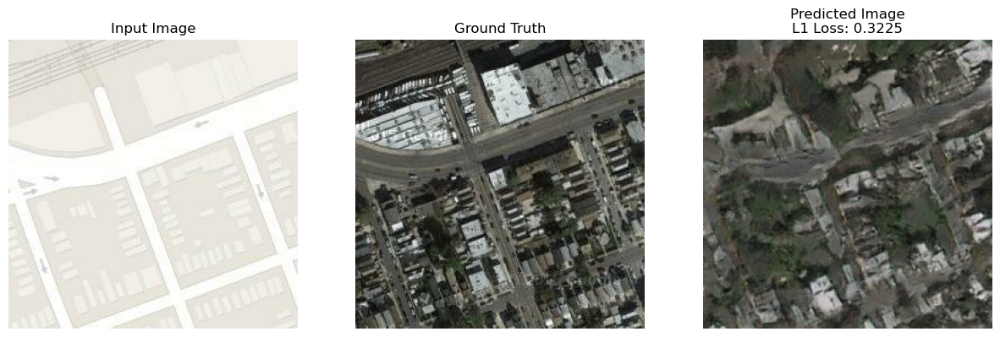

Epoch: 2, Step: 4384, Gen Loss: 27.7662, Disc Loss: 0.2226
Epoch: 3, Step: 4384, Gen Loss: 37.7220, Disc Loss: 0.1192
Epoch: 4, Step: 4384, Gen Loss: 26.1139, Disc Loss: 0.2241
Epoch: 5, Step: 4384, Gen Loss: 37.8496, Disc Loss: 0.0019
Epoch: 6, Step: 4384, Gen Loss: 35.9137, Disc Loss: 0.0064
Epoch: 7, Step: 4384, Gen Loss: 14.2830, Disc Loss: 1.7822
Epoch: 8, Step: 4384, Gen Loss: 21.7962, Disc Loss: 0.2770
Epoch: 9, Step: 4384, Gen Loss: 17.9952, Disc Loss: 1.3190
Epoch: 10, Step: 4384, Gen Loss: 18.9351, Disc Loss: 0.1708


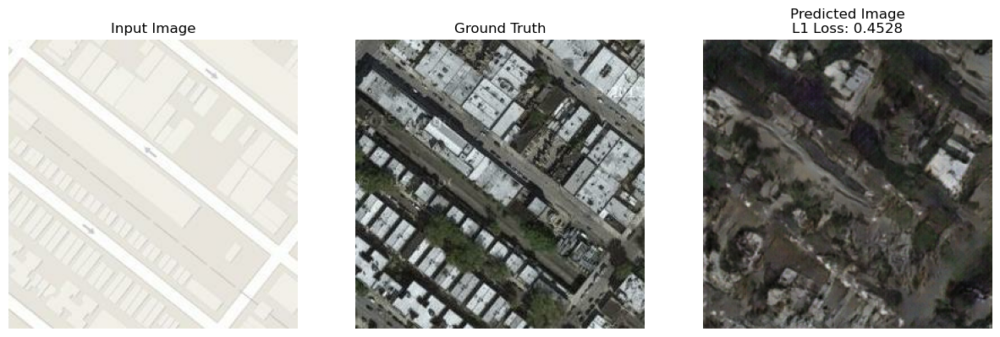

Epoch: 11, Step: 4384, Gen Loss: 19.8061, Disc Loss: 0.0049
Epoch: 12, Step: 4384, Gen Loss: 28.0164, Disc Loss: 0.3181
Epoch: 13, Step: 4384, Gen Loss: 6.1449, Disc Loss: 0.14857
Epoch: 14, Step: 4384, Gen Loss: 35.0023, Disc Loss: 0.0037
Epoch: 15, Step: 4384, Gen Loss: 30.9069, Disc Loss: 3.5197
Epoch: 16, Step: 4384, Gen Loss: 27.8238, Disc Loss: 0.1147
Epoch: 17, Step: 4384, Gen Loss: 6.1105, Disc Loss: 0.02922
Epoch: 18, Step: 4384, Gen Loss: 22.1520, Disc Loss: 0.4389
Epoch: 19, Step: 4384, Gen Loss: 24.3666, Disc Loss: 0.0928
Epoch: 20, Step: 4384, Gen Loss: 34.2966, Disc Loss: 0.1096


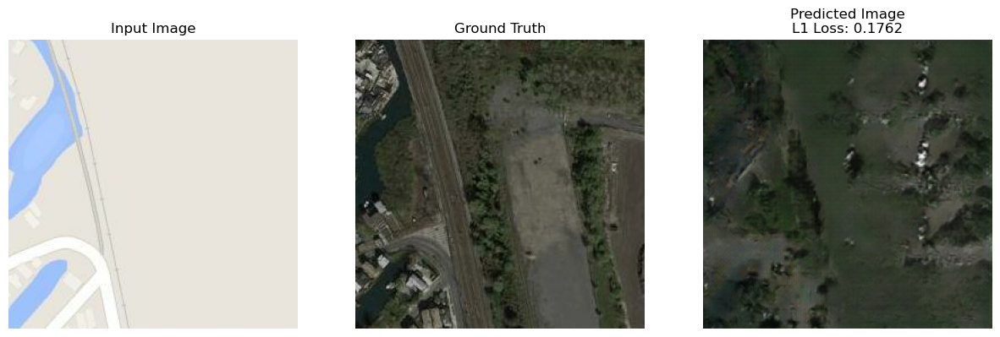

Epoch: 21, Step: 4384, Gen Loss: 35.2439, Disc Loss: 0.0147
Epoch: 22, Step: 4384, Gen Loss: 14.1013, Disc Loss: 0.1390
Epoch: 23, Step: 4384, Gen Loss: 27.8661, Disc Loss: 0.3141
Epoch: 24, Step: 4384, Gen Loss: 24.2892, Disc Loss: 0.1114
Epoch: 25, Step: 4384, Gen Loss: 33.2516, Disc Loss: 1.0869
Epoch: 26, Step: 4384, Gen Loss: 33.3360, Disc Loss: 0.0276
Epoch: 27, Step: 4384, Gen Loss: 35.3543, Disc Loss: 0.0085
Epoch: 28, Step: 4384, Gen Loss: 20.2210, Disc Loss: 0.3550
Epoch: 29, Step: 4384, Gen Loss: 9.9492, Disc Loss: 0.59839
Epoch: 30, Step: 4384, Gen Loss: 36.2839, Disc Loss: 0.0011


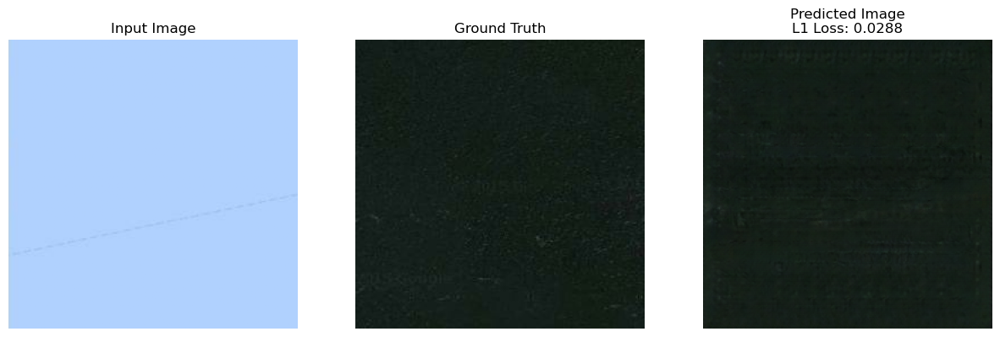

Epoch: 31, Step: 4384, Gen Loss: 35.0829, Disc Loss: 0.0063
Epoch: 32, Step: 4384, Gen Loss: 34.8411, Disc Loss: 0.0108
Epoch: 33, Step: 4384, Gen Loss: 4.8771, Disc Loss: 1.06556
Epoch: 34, Step: 4384, Gen Loss: 31.3235, Disc Loss: 1.0901
Epoch: 35, Step: 4384, Gen Loss: 27.1311, Disc Loss: 0.0086
Epoch: 36, Step: 4384, Gen Loss: 30.9350, Disc Loss: 1.57157
Epoch: 37, Step: 4384, Gen Loss: 5.7408, Disc Loss: 1.05899
Epoch: 38, Step: 4384, Gen Loss: 44.3849, Disc Loss: 0.0021
Epoch: 39, Step: 4384, Gen Loss: 24.9345, Disc Loss: 0.4166
Epoch: 40, Step: 4384, Gen Loss: 9.1575, Disc Loss: 0.35516


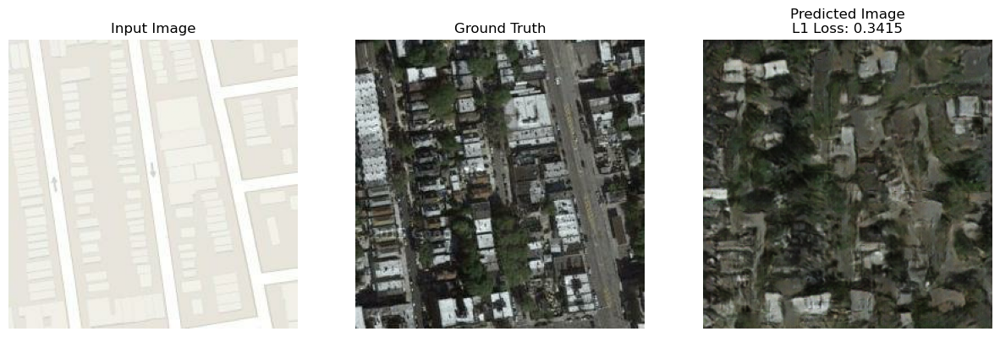

Epoch: 41, Step: 4384, Gen Loss: 38.7930, Disc Loss: 0.0043
Epoch: 42, Step: 4384, Gen Loss: 12.2562, Disc Loss: 0.0263
Epoch: 43, Step: 4384, Gen Loss: 46.4737, Disc Loss: 0.0000
Epoch: 44, Step: 4384, Gen Loss: 21.2250, Disc Loss: 0.1641
Epoch: 45, Step: 4384, Gen Loss: 16.1756, Disc Loss: 0.3035
Epoch: 46, Step: 4384, Gen Loss: 9.1969, Disc Loss: 0.46895
Epoch: 47, Step: 4384, Gen Loss: 21.6539, Disc Loss: 0.0738
Epoch: 48, Step: 4384, Gen Loss: 43.9415, Disc Loss: 0.0035
Epoch: 49, Step: 4384, Gen Loss: 31.0132, Disc Loss: 0.0823
Epoch: 50, Step: 4384, Gen Loss: 36.3861, Disc Loss: 0.0041


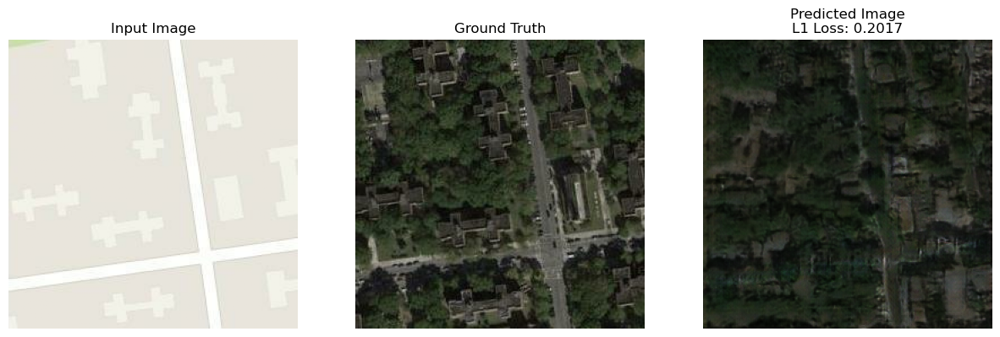

Epoch: 51, Step: 4384, Gen Loss: 42.7187, Disc Loss: 0.0024
Epoch: 52, Step: 4384, Gen Loss: 27.3589, Disc Loss: 0.2473
Epoch: 53, Step: 4384, Gen Loss: 39.7251, Disc Loss: 0.0008
Epoch: 54, Step: 4384, Gen Loss: 23.4861, Disc Loss: 0.0919
Epoch: 55, Step: 4384, Gen Loss: 17.9155, Disc Loss: 0.0029
Epoch: 56, Step: 4384, Gen Loss: 21.0394, Disc Loss: 1.5834
Epoch: 57, Step: 4384, Gen Loss: 23.9335, Disc Loss: 0.0009
Epoch: 58, Step: 4384, Gen Loss: 12.4938, Disc Loss: 1.6445
Epoch: 59, Step: 4384, Gen Loss: 34.5754, Disc Loss: 0.0045
Epoch: 60, Step: 4384, Gen Loss: 21.8088, Disc Loss: 0.6356


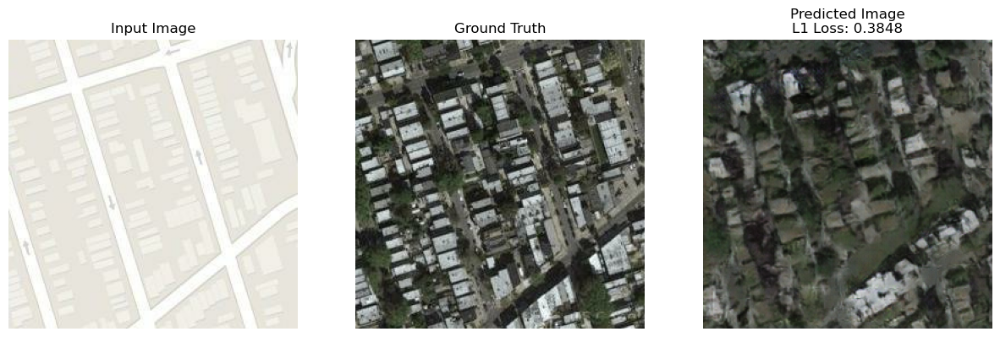

Epoch: 61, Step: 4384, Gen Loss: 27.5907, Disc Loss: 0.1288
Epoch: 62, Step: 4384, Gen Loss: 21.5953, Disc Loss: 3.7230
Epoch: 63, Step: 4384, Gen Loss: 51.5531, Disc Loss: 0.0001
Epoch: 64, Step: 4384, Gen Loss: 20.1011, Disc Loss: 0.2619
Epoch: 65, Step: 4384, Gen Loss: 17.7684, Disc Loss: 0.3238
Epoch: 66, Step: 4384, Gen Loss: 36.2719, Disc Loss: 0.0083
Epoch: 67, Step: 4384, Gen Loss: 10.9932, Disc Loss: 0.1693
Epoch: 68, Step: 4384, Gen Loss: 40.7216, Disc Loss: 0.0030
Epoch: 69, Step: 4384, Gen Loss: 31.2014, Disc Loss: 0.0074
Epoch: 70, Step: 4384, Gen Loss: 27.6671, Disc Loss: 0.3824


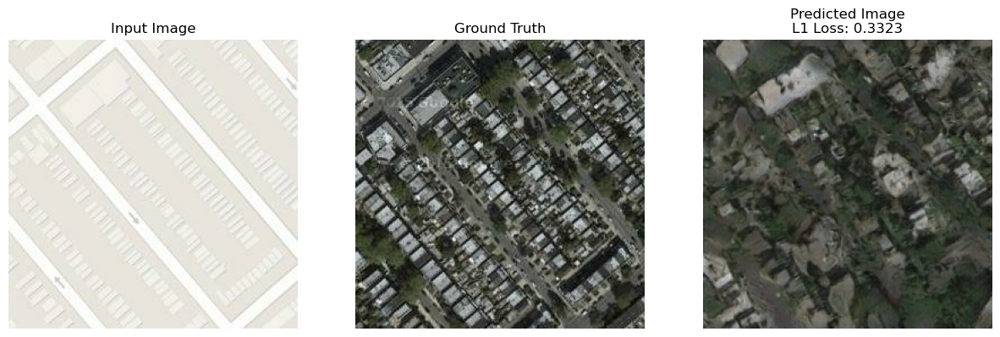

Epoch: 71, Step: 4384, Gen Loss: 35.1821, Disc Loss: 0.0267
Epoch: 72, Step: 4384, Gen Loss: 36.0898, Disc Loss: 0.3159
Epoch: 73, Step: 4384, Gen Loss: 14.5948, Disc Loss: 0.0023
Epoch: 74, Step: 4384, Gen Loss: 23.6215, Disc Loss: 0.5084
Epoch: 75, Step: 4384, Gen Loss: 7.2817, Disc Loss: 0.43884
Epoch: 76, Step: 4384, Gen Loss: 30.4689, Disc Loss: 0.2200
Epoch: 77, Step: 4384, Gen Loss: 38.8626, Disc Loss: 0.0135
Epoch: 78, Step: 4384, Gen Loss: 19.8605, Disc Loss: 0.1087
Epoch: 79, Step: 4384, Gen Loss: 34.0902, Disc Loss: 0.0514
Epoch: 80, Step: 4384, Gen Loss: 20.2369, Disc Loss: 0.2251


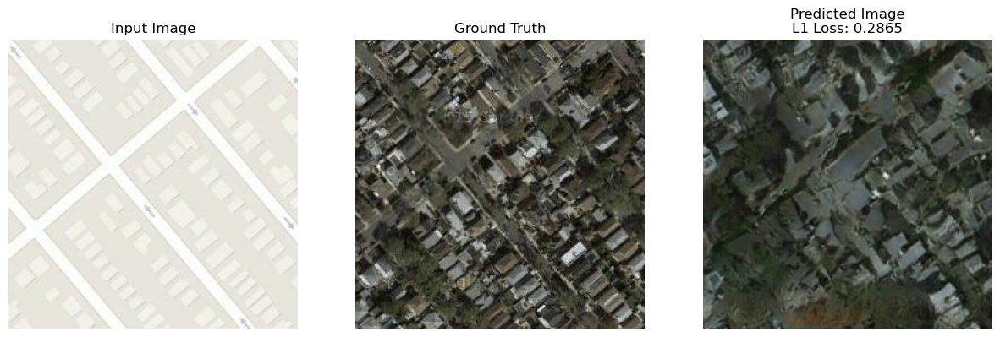

Epoch: 81, Step: 4384, Gen Loss: 10.9647, Disc Loss: 0.0183
Epoch: 82, Step: 4384, Gen Loss: 27.1510, Disc Loss: 0.2365
Epoch: 83, Step: 4384, Gen Loss: 29.5019, Disc Loss: 0.0125
Epoch: 84, Step: 4384, Gen Loss: 13.8826, Disc Loss: 0.0461
Epoch: 85, Step: 4384, Gen Loss: 45.6439, Disc Loss: 0.0006
Epoch: 86, Step: 4384, Gen Loss: 20.3081, Disc Loss: 0.0228
Epoch: 87, Step: 4384, Gen Loss: 15.1239, Disc Loss: 1.88628
Epoch: 88, Step: 4384, Gen Loss: 8.4513, Disc Loss: 0.14583
Epoch: 89, Step: 4384, Gen Loss: 16.9349, Disc Loss: 0.5772
Epoch: 90, Step: 4384, Gen Loss: 38.9165, Disc Loss: 0.0028


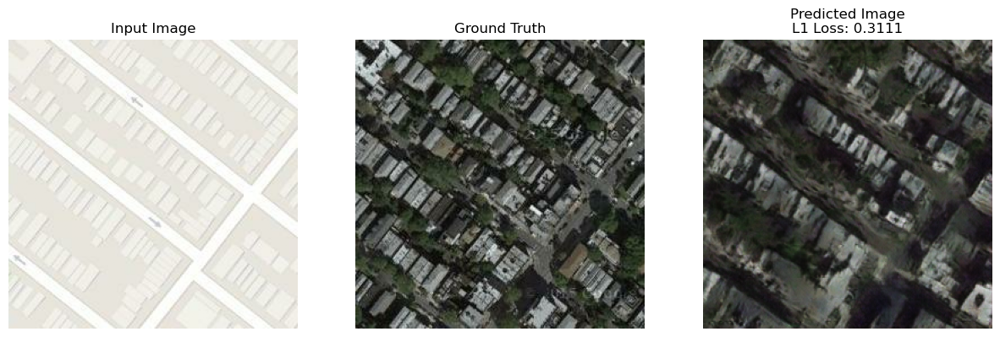

Epoch: 91, Step: 4384, Gen Loss: 39.0873, Disc Loss: 0.0092
Epoch: 92, Step: 4384, Gen Loss: 36.4333, Disc Loss: 0.0025
Epoch: 93, Step: 4384, Gen Loss: 16.0498, Disc Loss: 0.2068
Epoch: 94, Step: 4384, Gen Loss: 20.9755, Disc Loss: 0.0006
Epoch: 95, Step: 4384, Gen Loss: 29.6296, Disc Loss: 0.1578
Epoch: 96, Step: 4384, Gen Loss: 31.8609, Disc Loss: 0.0959
Epoch: 97, Step: 4384, Gen Loss: 9.0417, Disc Loss: 0.01455
Epoch: 98, Step: 4384, Gen Loss: 29.2614, Disc Loss: 0.0977
Epoch: 99, Step: 4384, Gen Loss: 30.1639, Disc Loss: 0.2169
Epoch: 100, Step: 4384, Gen Loss: 49.3882, Disc Loss: 0.0003


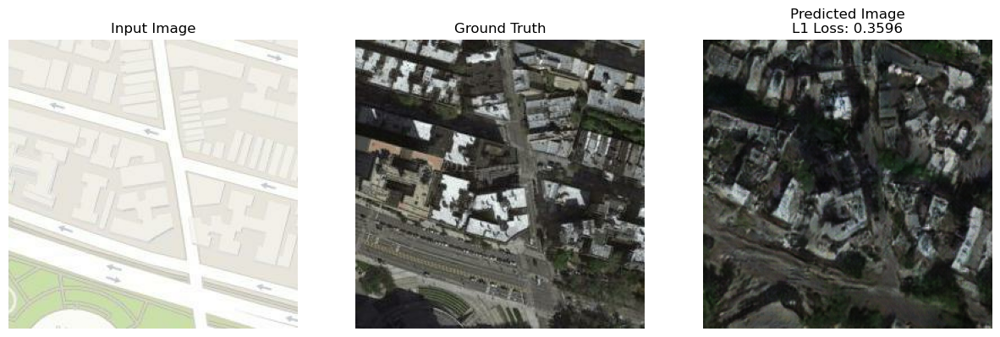

Epoch: 101, Step: 4384, Gen Loss: 34.5972, Disc Loss: 0.0122
Epoch: 102, Step: 4384, Gen Loss: 14.3825, Disc Loss: 0.4815
Epoch: 103, Step: 4384, Gen Loss: 29.7259, Disc Loss: 0.0000
Epoch: 104, Step: 4384, Gen Loss: 27.2037, Disc Loss: 1.3592
Epoch: 105, Step: 4384, Gen Loss: 32.1108, Disc Loss: 0.0912
Epoch: 106, Step: 4384, Gen Loss: 32.1785, Disc Loss: 0.0130
Epoch: 107, Step: 4384, Gen Loss: 35.0783, Disc Loss: 0.0008
Epoch: 108, Step: 4384, Gen Loss: 25.4040, Disc Loss: 0.0040
Epoch: 109, Step: 4384, Gen Loss: 20.9073, Disc Loss: 0.0058
Epoch: 110, Step: 4384, Gen Loss: 26.2291, Disc Loss: 0.3932


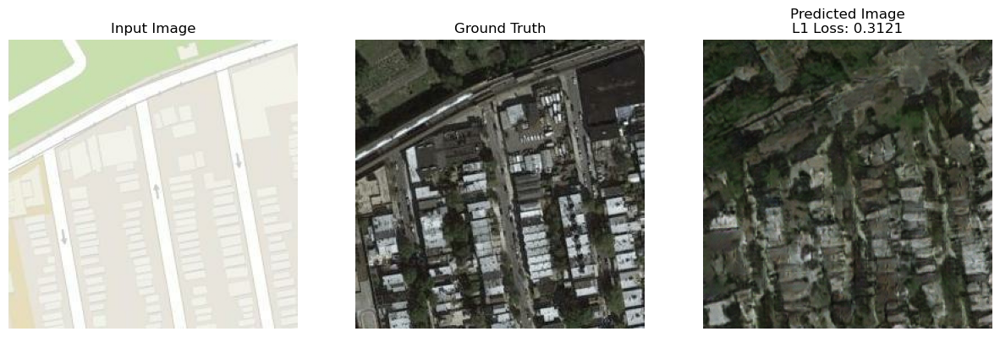

Epoch: 111, Step: 4384, Gen Loss: 36.1017, Disc Loss: 0.0011
Epoch: 112, Step: 4384, Gen Loss: 31.4232, Disc Loss: 1.1815
Epoch: 113, Step: 4384, Gen Loss: 27.7632, Disc Loss: 0.0305
Epoch: 114, Step: 4384, Gen Loss: 23.6665, Disc Loss: 0.5663
Epoch: 115, Step: 4384, Gen Loss: 11.3289, Disc Loss: 0.8359
Epoch: 116, Step: 4384, Gen Loss: 19.8942, Disc Loss: 0.2769
Epoch: 117, Step: 4384, Gen Loss: 42.5086, Disc Loss: 0.0008
Epoch: 118, Step: 4384, Gen Loss: 32.4633, Disc Loss: 0.6693
Epoch: 119, Step: 4384, Gen Loss: 31.6660, Disc Loss: 0.1579
Epoch: 120, Step: 4384, Gen Loss: 12.4184, Disc Loss: 0.0690


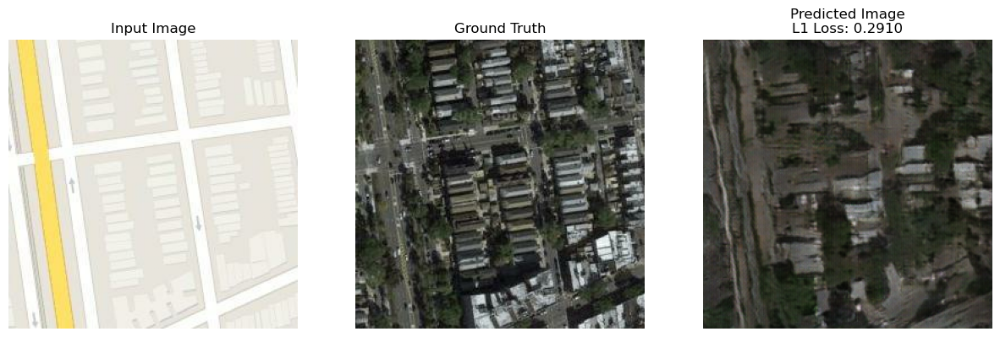

Epoch: 121, Step: 4384, Gen Loss: 27.9267, Disc Loss: 0.0576
Epoch: 122, Step: 4384, Gen Loss: 33.8977, Disc Loss: 0.0290
Epoch: 123, Step: 4384, Gen Loss: 20.3737, Disc Loss: 0.02457
Epoch: 124, Step: 4384, Gen Loss: 28.5924, Disc Loss: 0.1381
Epoch: 125, Step: 4384, Gen Loss: 32.0233, Disc Loss: 0.71792
Epoch: 126, Step: 4384, Gen Loss: 24.9889, Disc Loss: 0.0121
Epoch: 127, Step: 4384, Gen Loss: 35.0059, Disc Loss: 0.0118
Epoch: 128, Step: 4384, Gen Loss: 31.1831, Disc Loss: 0.0032
Epoch: 129, Step: 4384, Gen Loss: 22.7188, Disc Loss: 1.6804
Epoch: 130, Step: 4384, Gen Loss: 42.6779, Disc Loss: 0.0024


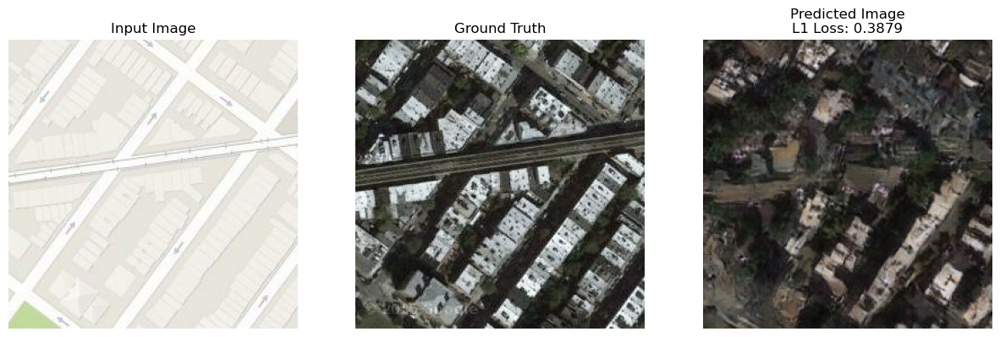

Epoch: 131, Step: 4384, Gen Loss: 36.5319, Disc Loss: 0.0193
Epoch: 132, Step: 4384, Gen Loss: 34.9793, Disc Loss: 0.0005
Epoch: 133, Step: 4384, Gen Loss: 28.2901, Disc Loss: 0.1090
Epoch: 134, Step: 4384, Gen Loss: 27.5392, Disc Loss: 0.0068
Epoch: 135, Step: 4384, Gen Loss: 11.6412, Disc Loss: 0.5567
Epoch: 136, Step: 4384, Gen Loss: 35.1892, Disc Loss: 0.0009
Epoch: 137, Step: 4384, Gen Loss: 39.7153, Disc Loss: 0.1891
Epoch: 138, Step: 4384, Gen Loss: 16.3513, Disc Loss: 0.4769
Epoch: 139, Step: 4384, Gen Loss: 36.2766, Disc Loss: 0.0086
Epoch: 140, Step: 4384, Gen Loss: 41.3155, Disc Loss: 0.0311


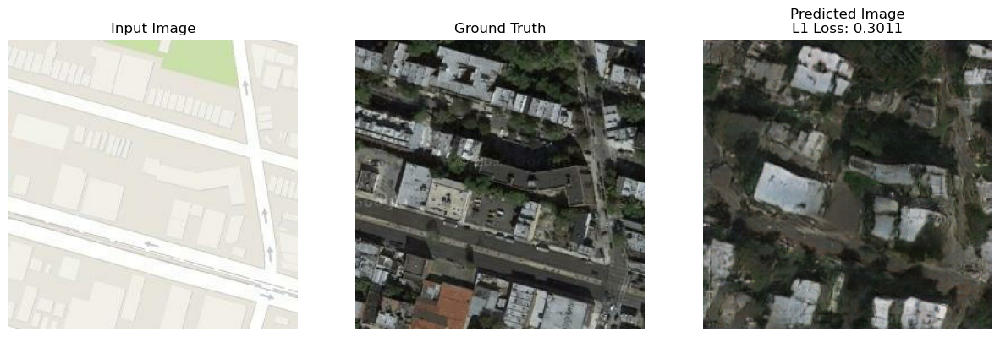

In [10]:
run = wandb.init(config=config, project="pix2pix")

fit(
    train_data=train,
    val_data=val,
    epochs=config["epochs"],
    generator=G,
    discriminator=D,
    generator_optimizer=g_optim,
    discriminator_optimizer=d_optim,
    l1_lambda=config["l1_lambda"],
)

In [11]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
fake_d_loss,██▇▇▇▇▆▅▄▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▃▄▃▃▃▃▃▂▂▁▂▁▁▂▂▂
fake_d_real_class_loss,▁▁▁▂▂▂▂▃▄▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇███▇▇▇
l1_loss,▇█▇▅▅▇▅▃▅▆▄▇▇▆▄▃▃▅▆▅▆▃▅▇▃▄▄▄▃▄▄▇▃▁▆▇▄▆▆▄
real_d_loss,███▇▇▇▆▅▄▅▅▅▅▅▅▅▄▄▄▄▅▄▄▄▃▃▃▃▃▃▃▂▂▂▂▁▁▂▂▂
total_disc_loss,███▇▇▇▆▅▄▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▃▂▂▁▂▁▁▂▂▂
total_gen_loss,▁▁▁▁▁▂▂▃▄▃▃▄▃▄▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▇▇▇███▇▇▇
epoch,140
fake_d_loss,0.09698
fake_d_real_class_loss,5.70991
l1_loss,0.22343
